# Jupyter Notebook to Produce Main text Figures of Paper
**Interannual Variability of Tropical Cyclones Landfall in the Eastern North Pacific. Environmental Drivers and Implications**

## Loading packages and defining some formats

In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
from matplotlib.font_manager import FontProperties
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.mpl.geoaxes import GeoAxes
import seaborn as sns
import calendar
from datetime import datetime
import cmocean
import warnings
warnings.filterwarnings("ignore")

In [2]:
##### Define AxesGrid parameters
projection = ccrs.PlateCarree(central_longitude=-180)
mproj = ccrs.PlateCarree()
axes_class = (GeoAxes, dict(map_projection=projection))

###### Define SNS parameters
sns.set_style('white')
sns.set_context("paper", font_scale = 2)

In [3]:
# Colorbar normalization
class MidpointNormalize(mcolors.Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        mcolors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        v_ext = np.max( [ np.abs(self.vmin), np.abs(self.vmax) ] )
        x, y = [-v_ext, self.midpoint, v_ext], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

## Figure 1

In [4]:
# Load data from saved files
save_dir = "../ENP-Tropical-Cyclones-Landfall/data_plots/"

topography = xr.open_dataarray(f"{save_dir}/fig1/topography_data.nc")
ep_filtered = xr.open_dataset(f"{save_dir}/fig1/ep_filtered_data.nc")
hlf_years = np.loadtxt(f"{save_dir}/fig1/hlf_years.txt", dtype=int)
llf_years = np.loadtxt(f"{save_dir}/fig1/llf_years.txt", dtype=int)
lf_yearly = np.loadtxt(f"{save_dir}/fig1/lf_yearly_data.txt", delimiter=",")
gen_monthly = np.loadtxt(f"{save_dir}/fig1/gen_monthly_data.txt", delimiter=",")
df_melted = pd.read_csv(f"{save_dir}/fig1/df_melted_data.csv")
df_total_landfalls = pd.read_csv(f"{save_dir}/fig1/df_total_landfalls_data.csv")
monthly_landfalls_full = pd.read_csv(f"{save_dir}/fig1/monthly_landfalls_full_data.csv")

# Re-calculate hlf_Data and llf_Data
hlf_Data = xr.combine_nested(
    [ep_filtered.where(ep_filtered.ISO_TIME.dt.year == year + 1980, drop=True) for year in hlf_years], 
    concat_dim='index'
)
llf_Data = xr.combine_nested(
    [ep_filtered.where(ep_filtered.ISO_TIME.dt.year == year + 1980, drop=True) for year in llf_years], 
    concat_dim='index'
)
#define ini and last year of study
ini = 1980
last = 2022

# Create year list needed for some xarrays and pandas files
hlf_year_list = list(np.array(hlf_years)+ini)
llf_year_list = list(np.array(llf_years)+ini)

#calculate mean monthly genesis for panel c
mean_gen_monthlyH = np.mean(gen_monthly[hlf_years],axis=0)
mean_gen_monthlyL = np.mean(gen_monthly[llf_years],axis=0)
#calculate mean monthly landfalls for panel d

df_hlf = monthly_landfalls_full[monthly_landfalls_full['Year'].isin(hlf_year_list)]
df_llf = monthly_landfalls_full[monthly_landfalls_full['Year'].isin(llf_year_list)]
mean_hlf = df_hlf.groupby('Month_Abbr')['Total_Landfalls'].mean().reindex(calendar.month_abbr[1:])
mean_llf = df_llf.groupby('Month_Abbr')['Total_Landfalls'].mean().reindex(calendar.month_abbr[1:])

In [5]:
# Plotting cell for Fig 1 (same code as original)
# Set up the figure and gridspec
months = list(calendar.month_abbr[1:])
fig = plt.figure(figsize=(30, 15), dpi=500)
gs = gridspec.GridSpec(2, 4, height_ratios=[1.25, 1], width_ratios=[1,0.1,0.1, 1])

# Added forth plot top left panel
ax = plt.subplot(gs[0,:3], projection = ccrs.PlateCarree())
pos = ax.get_position()  # This moves the subplot to the left by half its width
# ax.set_position([pos.x0, pos.y0, pos.width*0.25, pos.height])
ax.set_facecolor('white')
ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black', zorder=2)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5, color='black', zorder=2)
ax.set_extent([-133,-83,4,31], crs=mproj)

gl = ax.gridlines(crs=mproj, draw_labels=True, linewidth=1, color='black', alpha=0.5, linestyle='--')
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlocator = mticker.FixedLocator([-140, -120, -100, -80, -60])
gl.ylocator = mticker.FixedLocator([-5, 0, 5, 10, 20, 30, 40])
gl.xlabels_top = gl.ylabels_right = False
gl.xlines = gl.ylines = False

gl.xlabel_style = {'size': 18, 'color': 'gray', 'weight': 'bold'}  # Set font size for x labels
gl.ylabel_style = {'size': 18, 'color': 'gray', 'weight': 'bold'}

masked_topography = np.ma.masked_less(topography.values, 2)
cm = ax.contourf(topography.longitude, topography.latitude, masked_topography,
                 transform=ccrs.PlateCarree(), cmap='terrain', alpha=1.0, zorder=2)

storm_list = np.unique(llf_Data.SID.data) # Grab unique storm identifiers

for i in np.arange(0, storm_list.shape[0]):     # Plot lats, lons for individual storms
    lats = ep_filtered.where(ep_filtered.SID==storm_list[i]).LAT.data
    lons = ep_filtered.where(ep_filtered.SID==storm_list[i]).LON.data
    if np.any(ep_filtered.where(ep_filtered.SID==storm_list[i]).LANDFALL.data=='0'):
        genesis_lat = lats[~np.isnan(lats.astype('float'))][0]
        genesis_lon = lons[~np.isnan(lons.astype('float'))][0]
        if (genesis_lat > 19 and genesis_lon > -96) or (genesis_lat < 19 and genesis_lon > -88):
            ax.plot(lons, lats,
                transform=ccrs.PlateCarree(),
                color='lightblue',
                linewidth=0.5,
                zorder=3)
        else:
            ax.plot(lons, lats,
                transform=ccrs.PlateCarree(),
                color='blue',
                linewidth=0.5,
                zorder=3) 
            ax.plot(genesis_lon, genesis_lat,
                transform=ccrs.PlateCarree(),
                marker='o',
                markersize=3,
                markerfacecolor='green',
                markeredgecolor='black',
                zorder=4)
    else:
        ax.plot(lons, lats,
            transform=ccrs.PlateCarree(),
            color='lightblue',
            linewidth=0.5,
            alpha=0.35,
            zorder=3)


storm_list = np.unique(hlf_Data.SID.data) # Grab unique storm identifiers

for i in np.arange(0, storm_list.shape[0]):     # Plot lats, lons for individual storms
    lats = ep_filtered.where(ep_filtered.SID==storm_list[i]).LAT.data
    lons = ep_filtered.where(ep_filtered.SID==storm_list[i]).LON.data

    if np.any(ep_filtered.where(ep_filtered.SID==storm_list[i]).LANDFALL.data=='0'):
        genesis_lat = lats[~np.isnan(lats.astype('float'))][0]
        genesis_lon = lons[~np.isnan(lons.astype('float'))][0]
        if (genesis_lat > 19 and genesis_lon > -96) or (genesis_lat < 19 and genesis_lon > -88):
            ax.plot(lons, lats,
                transform=ccrs.PlateCarree(),
                color='lightblue',
                linewidth=0.5,
                zorder=3)
        else:
            ax.plot(lons, lats,
                transform=ccrs.PlateCarree(),
                color='red',
                linewidth=0.5,
                zorder=3) 
            ax.plot(genesis_lon, genesis_lat,
                transform=ccrs.PlateCarree(),
                marker='o',
                markersize=3,
                markerfacecolor='darkviolet',
                markeredgecolor='black',
                zorder=4)
    else:
        ax.plot(lons, lats,
            transform=ccrs.PlateCarree(),
            color='lightcoral',
            linewidth=0.5,
            alpha=0.35,
            zorder=3)

Xx = [-116,-116]
Yy = [0, 31]


# Add a colorbar to the map
cbar = plt.colorbar(cm, ax=ax, orientation='vertical', shrink=0.55, pad=0.05)
cbar.set_label('Height [km]', fontsize=18)
cbar.ax.tick_params(labelsize=18)

high_landfall_proxy = mpatches.Patch(color='red', label='High Landfall Years')
low_landfall_proxy = mpatches.Patch(color='blue', label='Low Landfall Years')
legend = ax.legend(handles=[high_landfall_proxy, low_landfall_proxy], loc='upper left')
ax.set_title('Cyclones Tracks for High and Low Landfall Years', fontsize=22)


# First plot (Middle of the first row)
ax0 = plt.subplot(gs[1, :2])

sns.lineplot(x=np.arange(ini, last+1), y=lf_yearly, marker='o', color='k', linestyle='-', label=r'$N_{lf}$ Yearly', ax=ax0, markersize=13, linewidth=2)
ax0.plot(ini+np.array(hlf_years), lf_yearly[hlf_years],'r.', marker='o', label='HLF', markersize=10, linewidth=2)
ax0.plot(ini+np.array(llf_years), lf_yearly[llf_years],'b', marker='o', linestyle='none', label='LLF',markersize=10,linewidth=2)
mean = np.mean(lf_yearly)
ax0.plot(np.arange(ini,last+1), mean*np.ones_like(np.arange(ini,last+1)), color='k', linestyle='--', linewidth=1.5)
confidence_interval = 1.96 * np.std(lf_yearly) / np.sqrt(len(lf_yearly))
# ax0.fill_between(np.arange(ini, last+1), mean - confidence_interval, mean + confidence_interval, alpha=0.2, color='lightblue', label='95% CI')
ax0.set_title('Yearly Landfall Counts ($N_{lf}$) in the ENP', fontsize=22)
ax0.set_xlabel('Years', fontsize=18)
ax0.set_ylabel('$N_{lf}$', fontsize=18)
ax0.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, 0.99),
    ncol=3,
    fontsize=16,
    frameon=False
)
ax0.grid(True)
ax0.set_ylim(-0.5, 6.5)

# Second plot (First of the second row)
ax1 = plt.subplot(gs[0, 3])

sns.lineplot(data=df_melted, x='Month', y='Genesis Count', estimator='mean', ci=95, color='k', label='Climatology', marker='.', ax=ax1, markersize=16, linewidth=2.5)
ax1.plot(calendar.month_abbr[4:], mean_gen_monthlyH[3:], 'r-', label=r'HLF', marker='.', markersize=13, linewidth=2.5)
ax1.plot(calendar.month_abbr[4:], mean_gen_monthlyL[3:], 'b-', label=r'LLF', marker='.', markersize=13, linewidth=2.5)
ax1.set_xlabel('Month', fontsize=18)
ax1.set_ylabel('Genesis Count [n]', fontsize=18)
ax1.set_title(r"Monthly Mean Genesis ($\overline{N_{{gen}}}$) in the ENP", fontsize=22)
ax1.set_xlim(months[3], months[11])  # Adjusting x-axis to focus from May through December
ax1.legend()
ax1.grid()

# Third plot (Second of the second row)
ax2 = plt.subplot(gs[1, 3])

sns.lineplot(
    data=df_total_landfalls,
    x='Month_Abbr',
    y='Total_Landfalls',
    estimator='mean',
    ci=95,
    color='k',
    ax=ax2,
    label='Climatology',
    marker='.',
    markersize=16,
    linewidth=2.5
)

# Overlaying hlf and llf mean lines
ax2.plot(months, mean_hlf.values, 'r-', label='HLF', marker='.', markersize=13, linewidth=2.5)
ax2.plot(months, mean_llf.values, 'b-', label='LLF', marker='.', markersize=13, linewidth=2.5)

# Setting titles and labels
ax2.set_title('Monthly Mean Landfall Count ($\overline{N_{{lf}}}$) in the ENP', fontsize=22)
ax2.legend(loc='best')
ax2.grid(True)
ax2.set_xlabel("Month", fontsize=18)
ax2.set_ylabel(r"Number of Landfalls $[n]$", fontsize=18)
ax2.set_ylim(0, 1.6)
ax2.set_yticks(np.arange(0, 1.8,0.2))

# Optionally, focus on a specific range of months (e.g., May through December)
focus_months = months[3:]  # From May (index 4) to December
ax2.set_xticks(focus_months)
ax2.set_xlim(focus_months[0], focus_months[-1])



# Function to add label to the subplot
def add_subplot_label(ax, label):
    # Transform from Axes coordinates (0-1) to Figure coordinates
    trans = ax.transAxes
    # Use the transform to position the text in the Axes coordinates
    ax.text(-0.05, 1.1, label, transform=trans, fontsize=22, fontweight='bold', va='top', ha='right')

# Add labels to the subplots
add_subplot_label(ax, 'a)')
add_subplot_label(ax0, 'b)')
add_subplot_label(ax1, 'c)')
add_subplot_label(ax2, 'd)')


plt.suptitle('Climatology of Eastern North Pacific Tropical Cyclones', fontsize=32, y=0.93)
plt.tight_layout()


# plt.savefig('../ENP-Tropical-Cyclones-Landfall/Plots/ENP_Paper/Fig1.png')
plt.show()

## Figure 2
Original figure and data processing was made on R please see the Rmd file

## Figure 3

### panel a

In [6]:
# Load data
decomposition_data = xr.load_dataset(f"{save_dir}/fig3/decomposition_data.nc")

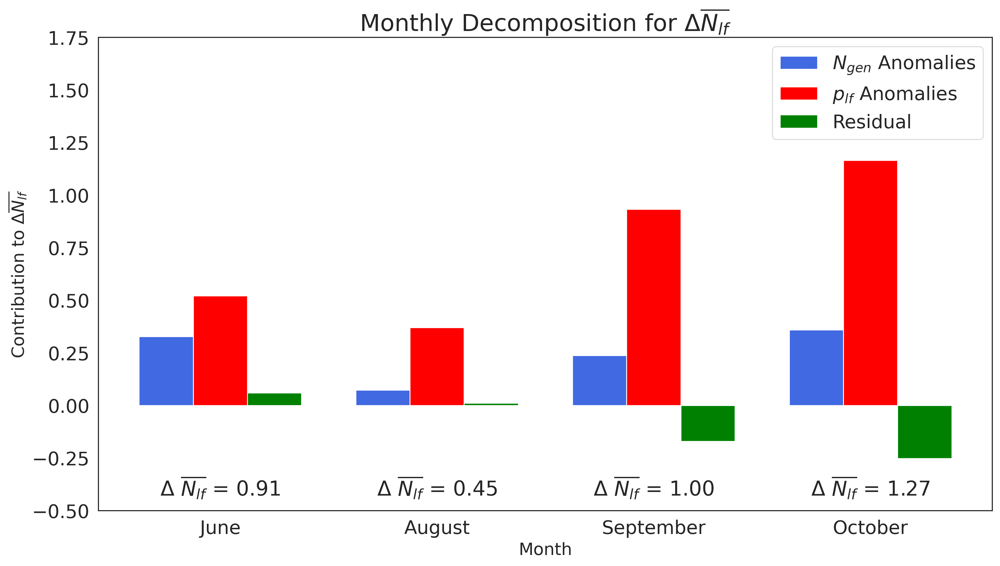

In [7]:
# Extract and calculate the sums across all boxes for each month
months = ["June", "August", "September", "October"]
Gen_Anom = [np.sum(decomposition_data["Ngen_anom_term"].sel(month=month).values) for month in months]
Plf_anom = [np.sum(decomposition_data["plf_anom_term"].sel(month=month).values) for month in months]
Res = [np.sum(decomposition_data["anomalies"].sel(month=month).values) for month in months]
DIFF = decomposition_data["Delta_Nlf"].values

# Create a DataFrame with the data
data = {
    'Month': months,
    'Gen_Anom': Gen_Anom,
    'Plf_anom': Plf_anom,
    'Res': Res,
    'DIFF': DIFF
}
df = pd.DataFrame(data)

# Define the width of the bars and the positions
bar_width = 0.25
index = np.arange(len(df))

# Create the bar plot
fig = plt.figure(figsize=(15, 8), dpi=300)
ax = plt.subplot(111)

# Plot each bar for Gen_Anom, Plf_anom, and Res
bars1 = ax.bar(index, df['Gen_Anom'], bar_width, label=r'$N_{gen}$ Anomalies', color='royalblue')
bars2 = ax.bar(index + bar_width, df['Plf_anom'], bar_width, label=r'$p_{lf}$ Anomalies', color='red')
bars3 = ax.bar(index + 2 * bar_width, df['Res'], bar_width, label='Residual', color='green')

# Add the DIFF values as text under the month names
for idx in index:
    ax.text(idx + bar_width, -0.45, r'$\Delta$ $\overline{N_{lf}}$ = ' + f'{df.loc[idx, "DIFF"]:.2f}', ha='center', va='bottom')

# Add some text for labels, title, and axes ticks
ax.set_xlabel('Month', fontsize=16)
ax.set_ylabel(r'Contribution to $\Delta \overline{N_{lf}}$', fontsize=16)
ax.set_title(r'Monthly Decomposition for $\Delta \overline{N_{lf}}$', fontsize=22)
ax.set_xticks(index + bar_width)
ax.set_xticklabels(df['Month'])
ax.set_ylim(-0.5, 1.75)  # Extend the y-axis downward to make room for the annotations

# Add a legend
ax.legend()

# Show the plot
plt.show()

### panel b

In [8]:
# load the data
U_hlf = xr.open_dataset(f"{save_dir}/fig3/U_hlf_data.nc")
V_hlf = xr.open_dataset(f"{save_dir}/fig3/V_hlf_data.nc")
U_llf = xr.open_dataset(f"{save_dir}/fig3/U_llf_data.nc")
V_llf = xr.open_dataset(f"{save_dir}/fig3/V_llf_data.nc")

x = np.loadtxt(f"{save_dir}/fig3/x_meshgrid.txt", delimiter=",")
y = np.loadtxt(f"{save_dir}/fig3/y_meshgrid.txt", delimiter=",")

llf_gen_lat_npz = np.load(f"{save_dir}/fig3/gen_lats_llf.npz")
llf_gen_lon_npz = np.load(f"{save_dir}/fig3/gen_lons_llf.npz")
hlf_gen_lat_npz = np.load(f"{save_dir}/fig3/gen_lats_hlf.npz")
hlf_gen_lon_npz = np.load(f"{save_dir}/fig3/gen_lons_hlf.npz")

llf_gen_lat = [llf_gen_lat_npz[key] for key in llf_gen_lat_npz]
llf_gen_lon = [llf_gen_lon_npz[key] for key in llf_gen_lon_npz]
hlf_gen_lat = [hlf_gen_lat_npz[key] for key in hlf_gen_lat_npz]
hlf_gen_lon = [hlf_gen_lon_npz[key] for key in hlf_gen_lon_npz]

pprime_term_npz = np.load(f"{save_dir}/fig3/pprime_term.npz")
# Convert the loaded data back into a list of numpy matrices
pprime_term = [pprime_term_npz[key] for key in pprime_term_npz]

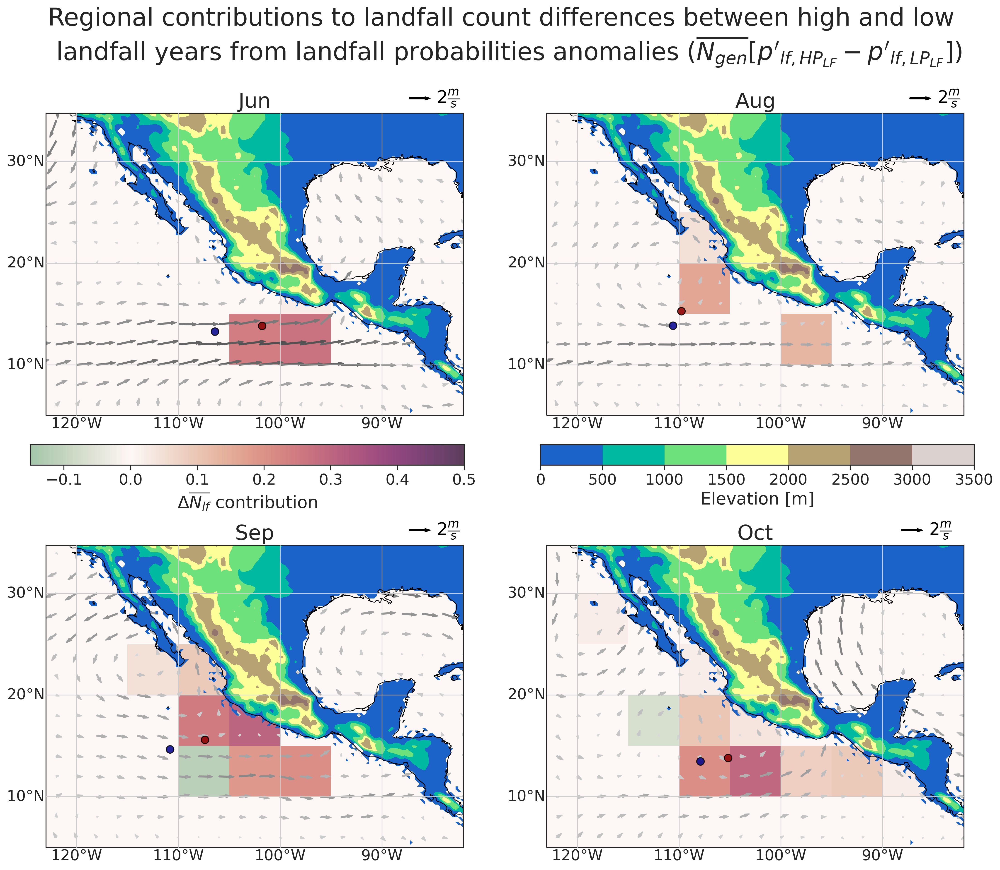

In [9]:
# Define the months to be plotted
months = [6, 8, 9, 10]  # June, August, September, October
# Create the figure and define the grid
fig = plt.figure(figsize=(15, 15), dpi=300)
gs = gridspec.GridSpec(2, 2, hspace=0.3)  # Adjust the grid as needed

# Define colormap and normalization for the plots
cmap_hist = cmocean.cm.curl  # Choose a colormap
norm_hist = MidpointNormalize(vmin=-0.15, vmax=0.5, midpoint=0)

# Iterate over the months and plot the third term for each
for i, month in enumerate(months):
    term = pprime_term[i]
    # Plot the data
    ax = fig.add_subplot(gs[i], projection=ccrs.PlateCarree())    
    quadmesh = ax.pcolormesh(x, y, term.T, cmap=cmap_hist, norm=norm_hist, transform=ccrs.PlateCarree(), alpha=0.8)
   
    # make quiver plot
    # Plot the wind data on the subplot in vectors
    X = U_hlf.longitude
    Y = U_hlf.latitude
    XX, YY = np.meshgrid(X, Y)
    u = U_hlf.where(U_hlf.time.dt.month==month, drop=True).mean(dim='time')
    v = V_hlf.where(V_hlf.time.dt.month==month, drop=True).mean(dim='time')
    u2 = U_llf.where(U_llf.time.dt.month==month, drop=True).mean(dim='time')
    v2 = V_llf.where(V_llf.time.dt.month==month, drop=True).mean(dim='time')
    uu = u.U
    vv = v.V
    uu2 = u2.U
    vv2 = v2.V
    
    kk = 8 #9 is nice for presentations
    mag = np.sqrt((uu[::kk, ::kk] - uu2[::kk, ::kk])**2 + (vv[::kk, ::kk] - vv2[::kk, ::kk])**2)

    # Calculate mean of filtered points
    llf_mean_gen_lat = np.mean(llf_gen_lat[i])
    llf_mean_gen_lon = np.mean(llf_gen_lon[i])
    
    ax.plot(llf_mean_gen_lon,  llf_mean_gen_lat,
        transform=ccrs.PlateCarree(),
        marker='o',
        markersize=8,
        alpha=0.85,
        markerfacecolor='darkblue',
        markeredgecolor='black',
        zorder=4)
    
    hlf_mean_gen_lat = np.mean(hlf_gen_lat[i])
    hlf_mean_gen_lon = np.mean(hlf_gen_lon[i])

    ax.plot(hlf_mean_gen_lon,  hlf_mean_gen_lat,
        transform=ccrs.PlateCarree(),
        marker='o',
        markersize=8,
        alpha=0.85,
        markerfacecolor='darkred',
        markeredgecolor='black',
        zorder=4)

    
    
    if month ==6:
        norm_quiv = mcolors.Normalize(vmin=-1.0, vmax=3.7)
        Q = ax.quiver(X[::kk], Y[::kk], uu[::kk, ::kk] - uu2[::kk, ::kk], vv[::kk, ::kk] - vv2[::kk, ::kk], 
                      mag, norm=norm_quiv, cmap= 'Greys',scale = 40, linewidth=1.10, edgecolor='face', transform=ccrs.PlateCarree()) 
        qk = ax.quiverkey(Q, 0.92, 1.05, 2, r'$2 \frac{m}{s}$', labelpos='E',
                  coordinates='axes', color='k', labelcolor='k', fontproperties=FontProperties(size=18))
    elif month ==10:
        norm_quiv = mcolors.Normalize(vmin=-1.0, vmax=3.7)
        Q = ax.quiver(X[::kk], Y[::kk], uu[::kk, ::kk] - uu2[::kk, ::kk], vv[::kk, ::kk] - vv2[::kk, ::kk], 
                      mag, norm=norm_quiv, cmap= 'Greys',scale = 40, linewidth=1.10, edgecolor='face', transform=ccrs.PlateCarree()) 
        qk = ax.quiverkey(Q, 0.90, 1.05, 2, r'$2 \frac{m}{s}$', labelpos='E',
                  coordinates='axes', color='k', labelcolor='k',fontproperties=FontProperties(size=18))
    
    else:
        norm_quiv = mcolors.Normalize(vmin=-1.0, vmax=3.7)
        Q = ax.quiver(X[::kk], Y[::kk], uu[::kk, ::kk] - uu2[::kk, ::kk], vv[::kk, ::kk] - vv2[::kk, ::kk], 
                      mag, norm=norm_quiv, cmap= 'Greys', units='width',scale = 40, linewidth=1.10, edgecolor='face', transform=ccrs.PlateCarree()) 
        qk = ax.quiverkey(Q, 0.92, 1.05, 2, r'$2 \frac{m}{s}$', labelpos='E',
                  coordinates='axes', color='k', labelcolor='k',fontproperties=FontProperties(size=18))

    # Set the title for the subplot
    ax.set_title(f"{calendar.month_abbr[month]}", fontsize=22)
    cm = ax.contourf(topography.longitude, topography.latitude,masked_topography,
                     transform=ccrs.PlateCarree(), cmap='terrain', alpha=1.0)
        # Add coastlines, gridlines, and quiver plot to the subplot
    ax.coastlines()
    # ax.set_extent([x - 360 if i < 2 else x for i, x in enumerate(region)])
    ax.set_extent([-123, -82, 5, 33])
    gl = ax.gridlines(draw_labels=True, zorder=3)
    gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 10))
    gl.ylocator = mticker.FixedLocator(np.arange(-90, 91, 10))
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabels_top = gl.ylabels_right = False
    gl.xlines = gl.ylines = True
    gl.xlabel_style = {'size': 16}
    gl.ylabel_style = {'size': 16}

    
# Add a colorbar for the genesis density map
hist_cbar_ax = fig.add_axes([0.035, 0.54, 0.425, 0.02])  # Adjust the position and size as needed
hist_cbar = fig.colorbar(quadmesh, cax=hist_cbar_ax, orientation='horizontal')
hist_cbar.ax.tick_params(labelsize=16)
hist_cbar.set_label(r'$\Delta \overline{N_{lf}}$ contribution', fontsize=18)  # Set the label for the colorbar

# Add a colorbar for the topography
hist_cbar_ax = fig.add_axes([0.535, 0.54, 0.425, 0.02])  # Adjust the position and size as needed
hist_cbar = fig.colorbar(cm, cax=hist_cbar_ax, orientation='horizontal')
hist_cbar.ax.tick_params(labelsize=16)
hist_cbar.set_label('Elevation [m]', fontsize=18) 

# Adjust the spacing between the subplots
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.15, top=0.9, wspace=0.2, hspace=0.3)
# Adjust the layout and display the plot
plt.suptitle("Regional contributions to landfall count differences between high and low \n landfall years from landfall probabilities anomalies ($\overline{N_{gen}} [p'_{lf,HP_{LF}}-p'_{lf,LP_{LF}}]$)", fontsize=26, y=0.99)
plt.tight_layout()
plt.show()

## Figure 4

### panal a

In [10]:
#load the data for this plot
dns = np.load(f"{save_dir}/fig4/dns.npy")
uw = xr.load_dataset(f"{save_dir}/fig4/u_enp_data.nc")
vw = xr.load_dataset(f"{save_dir}/fig4/v_enp_data.nc")

In [11]:
# Define the bounding boxes for the three regions
tehuantepec_box = [-96, -93.5, 14, 16]  # [min lon, max lon, min lat, max lat]
papagayo_box = [-89, -86, 12.3, 10]
specific_box = [-105, -95, 10, 15]
CLLJ_box = [-80,-70,12.5,17.5]
Monsoon_box = [-120,-90, 3, 15]

# Define a function to plot the boxes
def plot_box(ax, box, color, fill=True):
    lon_min, lon_max, lat_min, lat_max = box
    ax.add_patch(mpatches.Rectangle(xy=[lon_min, lat_min], width=lon_max-lon_min, height=lat_max-lat_min,
                                    transform=ccrs.PlateCarree(),
                                    fill=fill, color=color, alpha=0.4, edgecolor='black'))
# modified version, with zorder, and linewidth
def plot_box2(ax, box, color, linewidth, z, fill=True):
    lon_min, lon_max, lat_min, lat_max = box
    ax.add_patch(mpatches.Rectangle(xy=[lon_min, lat_min], width=lon_max-lon_min, height=lat_max-lat_min,
                                    transform=ccrs.PlateCarree(),
                                    fill=fill, color=color, alpha=0.75, edgecolor='black',
                                    linewidth=linewidth, zorder=z))

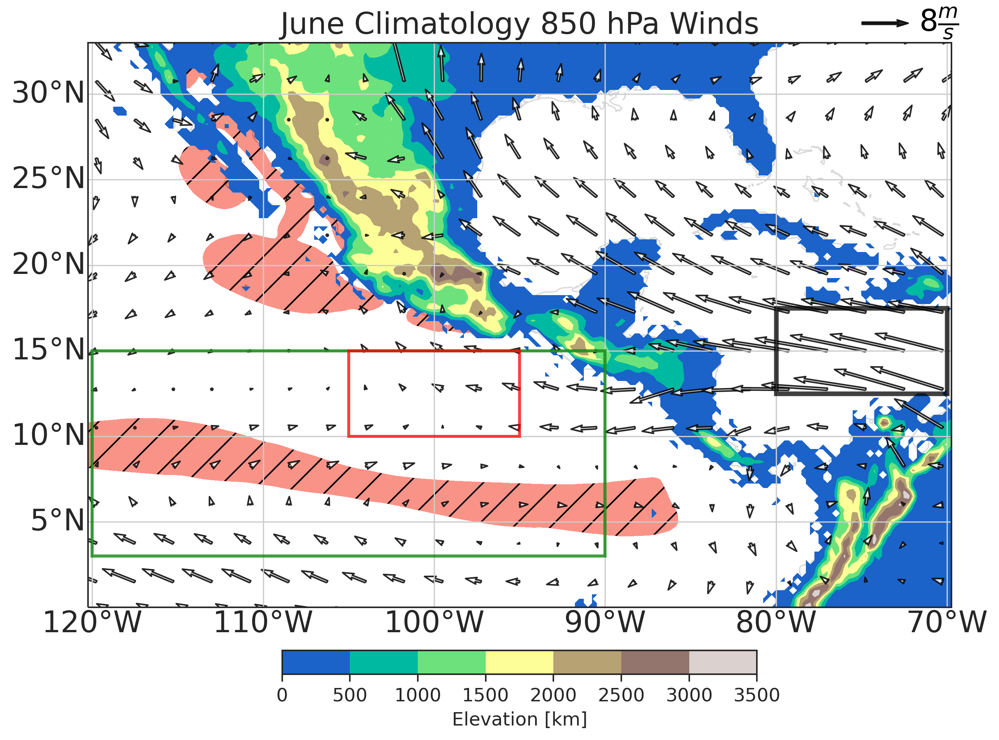

In [12]:
# Set up the map projection and create a new figure
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj}, dpi=300)

# Add features to the map
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Set the extent of the map (you can adjust this as needed)
ax.set_extent([-120.25, -69.75, 0, 33], crs=ccrs.PlateCarree())
longitudes = np.arange(1, 359.25, 0.25)    # Longitudes from 1°E to 359°E
latitudes = np.arange(60, -60.25, -0.25)

# Extract the topography data (replace 'elevation' with the name of your data variable)
topo_values = topography.values
min_elevation = 2  # Set to your desired minimum elevation level
masked_topography = np.ma.masked_less(topo_values, min_elevation)
fc = ax.contourf(longitudes,latitudes,dns,
     transform=ccrs.PlateCarree(), extend='both', add_colorbar=False,
    levels=[0,2.,7.0], colors=['white','salmon'], hatches=['/', None], alpha=0.85)
cm = ax.contourf(topography.longitude, topography.latitude,masked_topography,
            transform=ccrs.PlateCarree(), cmap='terrain', alpha=1)

# Plot the boxes for each region
plot_box2(ax, specific_box, 'red', fill=False, linewidth=1.9, z=4)
plot_box2(ax,CLLJ_box,'black',fill=False, linewidth=3,z=3)
plot_box2(ax,Monsoon_box,'green',fill=False, linewidth=2,z=3)

# Add wind vectors
# Plot the wind data on the subplot in vectors
X = uw.longitude.data
Y = uw.latitude.data
XX, YY = np.meshgrid(X, Y)
u = uw.groupby('time.month').mean().sel(level = 850,month=6, drop = True)
v = vw.groupby('time.month').mean().sel(level = 850, month=6, drop = True)
uu = u.U.data
vv = v.V.data
n=9 #12 is cool for presentations
mag = np.sqrt((uu[::n, ::n])**2 + (vv[::n, ::n])**2)
Q = ax.quiver(X[::n], Y[::n], uu[::n, ::n], vv[::n, ::n], color='white', linewidth=1.02, edgecolor='black',
              units='width', scale = 150,  transform=ccrs.PlateCarree(), alpha=0.85)
#for scale bigger the factor smaller the arrows
qk = ax.quiverkey(Q, 0.95, 1.035, 8, r'$8 \frac{m}{s}$', labelpos='E',
              coordinates='axes', color='k', labelcolor='k')


# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar to the map
cbar = plt.colorbar(cm, ax=ax, orientation='horizontal', shrink=0.55, pad=0.05)
cbar.set_label('Elevation [km]', fontsize=12)
cbar.ax.tick_params(labelsize=12)
plt.title('June Climatology 850 hPa Winds')

# Show the plot
plt.show()

### panel b

In [13]:
#load the data for this plot
precip_hlf = xr.load_dataset(f"{save_dir}/fig4/precip_hlf_data.nc")
precip_llf = xr.load_dataset(f"{save_dir}/fig4/precip_llf_data.nc")
us_hlf = xr.load_dataset(f"{save_dir}/fig4/us_hlf_data.nc")
us_llf = xr.load_dataset(f"{save_dir}/fig4/us_llf_data.nc")
vs_hlf = xr.load_dataset(f"{save_dir}/fig4/vs_hlf_data.nc")
vs_llf = xr.load_dataset(f"{save_dir}/fig4/vs_llf_data.nc")

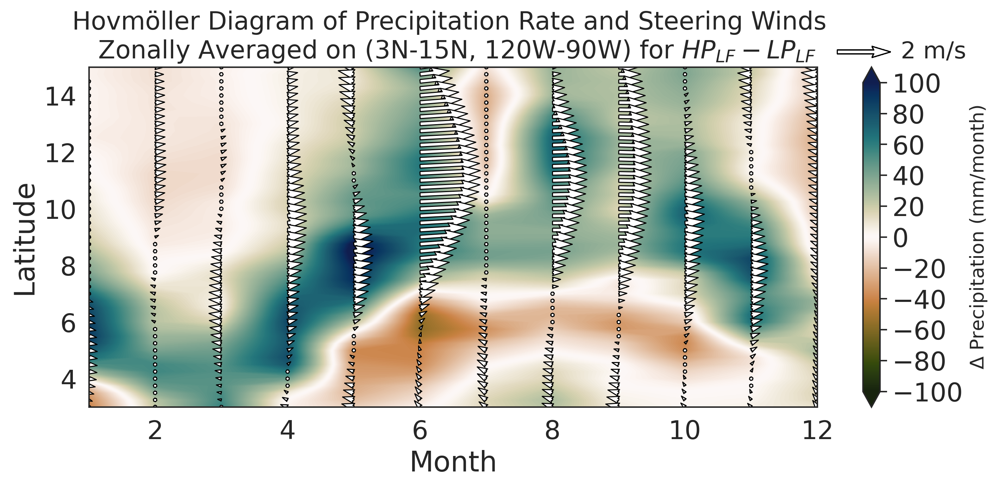

In [14]:
R = [-120,-90,3,15]

TP_Hov = precip_hlf.sel(longitude=slice((R[0])+360,R[1]+360), latitude = slice(R[3],R[2]), drop = True)
TP_Hov = TP_Hov['MTPR'].groupby('time.month').mean('time')
TP_Hov = TP_Hov.mean(dim='longitude')
u_Hov = us_hlf.sel(longitude=slice((R[0])+360,R[1]+360), latitude = slice(R[3],R[2]), drop = True)
u_Hov = u_Hov['U'].groupby('time.month').mean('time')
u_Hov = u_Hov.mean(dim='longitude')
v_Hov = vs_hlf.sel(longitude=slice((R[0])+360,R[1]+360), latitude = slice(R[3],R[2]), drop = True)
v_Hov = v_Hov['V'].groupby('time.month').mean('time')
v_Hov = v_Hov.mean(dim='longitude')
# Make a copy of the original DataArray
days_in_month = np.array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
TP_Hov_scaled = TP_Hov.copy()

# Iterate over months and adjust the values
for i in range(12):
    TP_Hov_scaled.loc[{'month': i+1}] *= days_in_month[i]
    
TP_Hov_hlf = TP_Hov_scaled.copy()
u_Hov_hlf = u_Hov.copy()
v_Hov_hlf = v_Hov.copy()

#now same but for llf

TP_Hov = precip_llf.sel(longitude=slice((R[0])+360,R[1]+360), latitude = slice(R[3],R[2]), drop = True)
TP_Hov = TP_Hov['MTPR'].groupby('time.month').mean('time')
TP_Hov = TP_Hov.mean(dim='longitude')
u_Hov = us_llf.sel(longitude=slice((R[0])+360,R[1]+360), latitude = slice(R[3],R[2]), drop = True)
u_Hov = u_Hov['U'].groupby('time.month').mean('time')
u_Hov = u_Hov.mean(dim='longitude')
v_Hov = vs_llf.sel(longitude=slice((R[0])+360,R[1]+360), latitude = slice(R[3],R[2]), drop = True)
v_Hov = v_Hov['V'].groupby('time.month').mean('time')
v_Hov = v_Hov.mean(dim='longitude')
# Make a copy of the original DataArray
days_in_month = np.array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
TP_Hov_scaled = TP_Hov.copy()

# Iterate over months and adjust the values
for i in range(12):
    TP_Hov_scaled.loc[{'month': i+1}] *= days_in_month[i]
    
TP_Hov_llf = TP_Hov_scaled.copy()
u_Hov_llf = u_Hov.copy()
v_Hov_llf = v_Hov.copy()

TP_Hov_scaled = TP_Hov_hlf - TP_Hov_llf
u_Hov = u_Hov_hlf - u_Hov_llf
v_Hov = v_Hov_hlf - v_Hov_llf

fig = plt.figure(figsize=(10, 5), dpi=300)
cm = -120
proj = ccrs.PlateCarree(central_longitude=cm)
ax = fig.add_subplot(1, 1, 1)
fc = ax.contourf(TP_Hov.month,TP_Hov.latitude,86400*TP_Hov_scaled.data.T,
                 extend='both', add_colorbar=False,
                 levels=np.arange(-100.0, 100.2, 0.2), cmap=cmocean.cm.tarn)

# Adjust these parameters as needed
arrow_scale = 2.5  # Smaller value for larger arrows
slice_step = 1  # Increase for fewer arrows

# Slicing the data to reduce the density of arrows
u_Hov_sliced = u_Hov[::slice_step, ::slice_step]
v_Hov_sliced = v_Hov[::slice_step, ::slice_step]
lat_sliced = u_Hov.latitude[::slice_step]
month_sliced = u_Hov.month[::slice_step]

# Plotting the quiver
Q = ax.quiver(month_sliced, lat_sliced, u_Hov_sliced.T, v_Hov_sliced.T, 
              scale=arrow_scale, color='white', edgecolor='black', 
              linewidth=0.7, angles='xy', scale_units='xy',  width=0.005, alpha=1)

# Add quiver key (adjust the value '2 m/s' as needed for your scale)
qk = ax.quiverkey(Q, 1.1, 1.045, 2, '2 m/s', labelpos='E', 
                  coordinates='axes', fontproperties={'size':16})


cb = plt.colorbar(fc, ax=ax, extend='both',ticks=np.arange(-100, 101, 20))
cb.set_label('$\Delta$ Precipitation (mm/month)', fontsize=13)
ax.set_title('Hovmöller Diagram of Precipitation Rate and Steering Winds \n Zonally Averaged on (3N-15N, 120W-90W) for $HP_{LF}-LP_{LF}$', fontsize=17)
ax.set_xlabel('Month')
ax.set_ylabel('Latitude')
plt.tight_layout()
plt.show()

### panel c

In [15]:
#load data
U_CLLJ = xr.load_dataset(f"{save_dir}/fig4/u_cllj_data.nc")
U_BOX = xr.load_dataset(f"{save_dir}/fig4/u_box_data.nc")
U_CLLJ_hlf = xr.load_dataset(f"{save_dir}/fig4/u_cllj__hlf_data.nc")
U_BOX_hlf = xr.load_dataset(f"{save_dir}/fig4/u_box_hlf_data.nc")
U_CLLJ_llf = xr.load_dataset(f"{save_dir}/fig4/u_cllj_llf_data.nc")
U_BOX_llf= xr.load_dataset(f"{save_dir}/fig4/u_box_llf_data.nc")

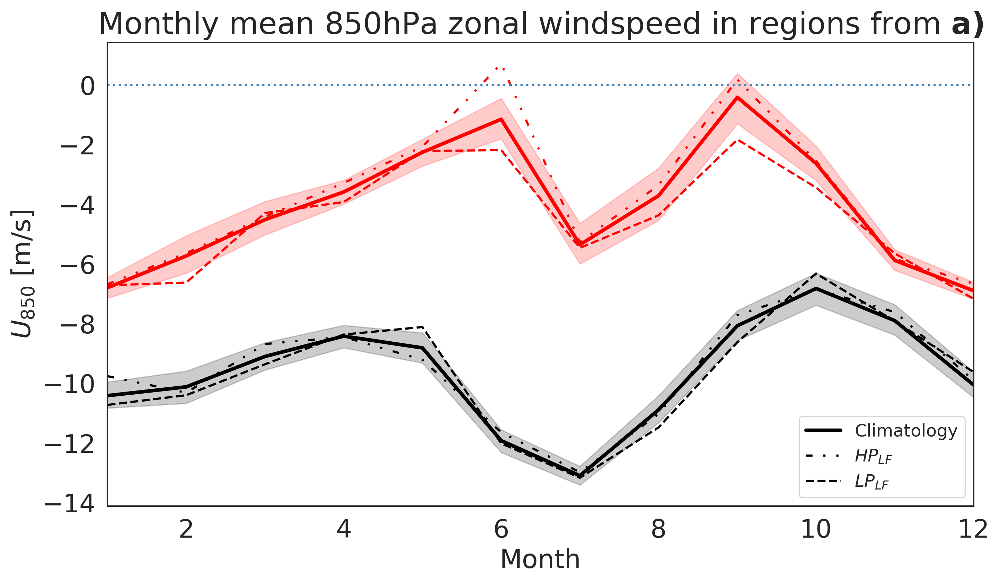

In [16]:
# Convert xarray DataArray to pandas DataFrame without taking the mean, so we keep all the years
U_CLLJ_df = U_CLLJ.to_dataframe().reset_index()
U_BOX_df = U_BOX.to_dataframe().reset_index()

# Extract the month from the time column
U_CLLJ_df['month'] = U_CLLJ_df['time'].dt.month
U_BOX_df['month'] = U_BOX_df['time'].dt.month

# Mean of climatological data for plotting
U_CLLJ_mean = U_CLLJ_df.groupby('month')['U'].mean().values
U_BOX_mean = U_BOX_df.groupby('month')['U'].mean().values

U_CLLJ_hlf_df = U_CLLJ_hlf.to_dataframe().reset_index()
U_BOX_hlf_df = U_BOX_hlf.to_dataframe().reset_index()
U_CLLJ_llf_df = U_CLLJ_llf.to_dataframe().reset_index()
U_BOX_llf_df = U_BOX_llf.to_dataframe().reset_index()

U_CLLJ_df['Category'] = 'Climatology'
U_BOX_df['Category'] = 'Climatology_BOX'
U_CLLJ_hlf_df['Category'] = 'HLF'
U_BOX_hlf_df['Category'] = 'HLF_BOX'
U_CLLJ_llf_df['Category'] = 'LLF'
U_BOX_llf_df['Category'] = 'LLF_BOX'

# Combine data into a single DataFrame
df = pd.concat([U_CLLJ_df, U_BOX_df, U_CLLJ_hlf_df, U_BOX_hlf_df, U_CLLJ_llf_df, U_BOX_llf_df])

# Plotting with seaborn
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
fig.set_facecolor('white')

# Plotting Climatology with 95% CI
sns.lineplot(data=U_CLLJ_df, x='month', y='U', label='Climatology', color = 'k',  ci=95, linewidth=2.5, ax=ax)
sns.lineplot(data=U_BOX_df, x='month', y='U', color = 'red', ci=95, linewidth=2.5, ax=ax)

# Plotting HLF and LLF without CI
sns.lineplot(data=U_CLLJ_hlf_df, x='month', y='U', label='$HP_{LF}$', color = 'k', linestyle=(0, (3, 5, 1, 5, 1, 5)), linewidth=1.5, ax=ax)
sns.lineplot(data=U_BOX_hlf_df, x='month', y='U', color = 'red', linestyle=(0, (3, 5, 1, 5, 1, 5)), linewidth=1.5, ax=ax)
sns.lineplot(data=U_CLLJ_llf_df, x='month', y='U', label='$LP_{LF}$', color = 'k', linestyle='--', linewidth=1.5, ax=ax)
sns.lineplot(data=U_BOX_llf_df, x='month', y='U', color = 'red', linestyle='--', linewidth=1.5, ax=ax)

ax.axhline(y=0, color='steelblue', linestyle=':', linewidth=1.5)

ax.set_xlim([1, 12])
ax.set_xlabel('Month', fontsize=18)
ax.set_ylabel(r'$U_{850}$ [m/s]', fontsize=18)
ax.set_title(r"Monthly mean 850hPa zonal windspeed in regions from $\bf{a)}$", fontsize=21)
plt.legend(loc=4, prop={'size': 12})
plt.tight_layout()
plt.show()